In [1]:
import pandas as pd             
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__)

4.5.0


In [3]:
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

In [4]:
import pandas_profiling as pp

In [5]:
train = pd.read_excel('loantrain1.xlsx')

In [6]:
test = pd.read_excel('loantest1.xlsx')

In [7]:
test.shape

(295, 12)

In [8]:
train.shape

(554, 13)

In [9]:
#pip install -->upgrade pip

In [10]:
pp.ProfileReport(train)

In [11]:
# Clean up missing credit hstory values; crosscheck loan status against credit history
# Dependents is labeled as Categorical beacuse of "+3" values, either change to numbers or assign none, low, medium or high
# Dependents also has missing values, crosscheck with coapplicant income, marital status, loan status (dependents can determine loan approval)
# Gender has missing values, may need to drop missing rows as there is no way to know extrapolate from the data
# Loan amount Term has missing values: Drop missing
# Married has missing values, crosscheck with coapplicant
# Drop missing values for self employed

In [12]:
train.isnull().sum(axis=0)

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64

In [13]:
Approved_Loans = train[train['Loan_Status'] == 'Y']

In [14]:
Disapproved_Loans = train[train['Loan_Status'] == 'N']

In [15]:
Approved_Loans.head(5)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,None,Graduate,No,5849,0.0,145,360,1,Urban,Y
2,LP001005,Male,Yes,None,Graduate,Yes,3000,0.0,66,360,1,Urban,Y
3,LP001006,Male,Yes,None,Not Graduate,No,2583,2358.0,120,360,1,Urban,Y
4,LP001008,Male,No,None,Graduate,No,6000,0.0,141,360,1,Urban,Y
5,LP001011,Male,Yes,Medium,Graduate,Yes,5417,4196.0,267,360,1,Urban,Y


In [16]:
Disapproved_Loans.Loan_Status.nunique()

1

In [17]:
Collateral_Value = Approved_Loans.groupby(['Property_Area'])['Loan_Status'].aggregate('count').reset_index()

In [18]:
Collateral_Value

,Property_Area,Loan_Status
0,Rural,99
1,Semiurban,163
2,Urban,120


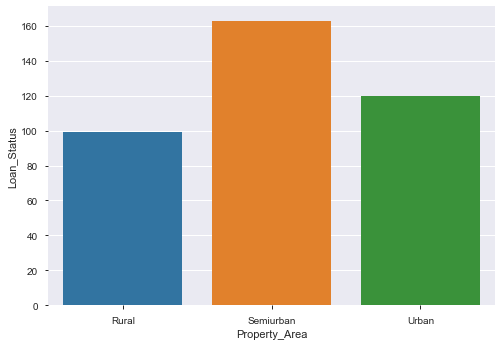

In [19]:
sns.barplot(x='Property_Area',y='Loan_Status',data=Collateral_Value)

In [20]:
Dis_Collateral_Value = Disapproved_Loans.groupby(['Property_Area'])['Loan_Status'].aggregate('count').reset_index()

In [21]:
Dis_Collateral_Value

,Property_Area,Loan_Status
0,Rural,62
1,Semiurban,49
2,Urban,61


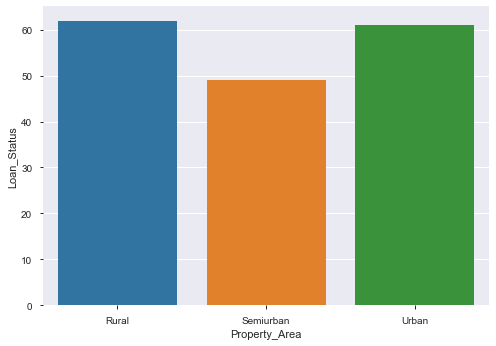

In [22]:
sns.barplot(x='Property_Area',y='Loan_Status',data=Dis_Collateral_Value)

In [23]:
Family_Size = Approved_Loans.groupby(['Dependents'])['Loan_Status'].aggregate('count').reset_index()

In [24]:
Family_Size

,Dependents,Loan_Status
0,High,29
1,Low,65
2,Medium,72
3,None,216


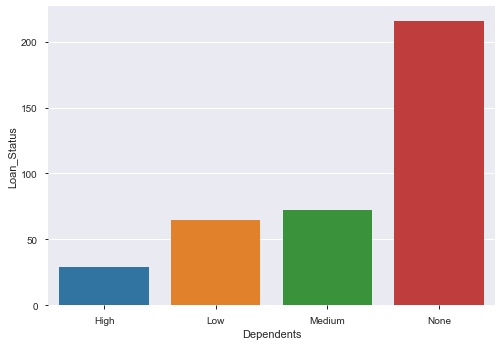

In [25]:
sns.barplot(x='Dependents',y='Loan_Status',data=Family_Size)

In [26]:
Dis_Family_Size = Disapproved_Loans.groupby(['Dependents'])['Loan_Status'].aggregate('count').reset_index()

In [27]:
Dis_Family_Size

,Dependents,Loan_Status
0,High,16
1,Low,37
2,Medium,22
3,None,97


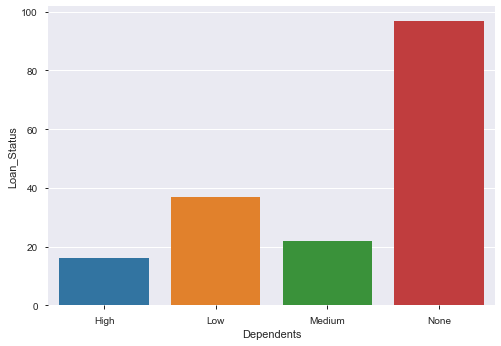

In [28]:
sns.barplot(x='Dependents',y='Loan_Status',data=Dis_Family_Size)

In [29]:
Dis_Financial_Obligations = Disapproved_Loans.groupby(['Credit_History'])['Loan_Status'].aggregate('count').reset_index()

In [30]:
Dis_Financial_Obligations

,Credit_History,Loan_Status
0,0,80
1,1,92


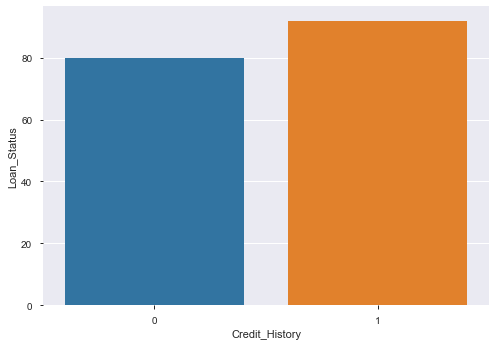

In [31]:
sns.barplot(x='Credit_History',y='Loan_Status',data=Dis_Financial_Obligations)

In [32]:
Financial_Obligations = Approved_Loans.groupby(['Credit_History'])['Loan_Status'].aggregate('count').reset_index()

In [33]:
Financial_Obligations

,Credit_History,Loan_Status
0,0,7
1,1,375


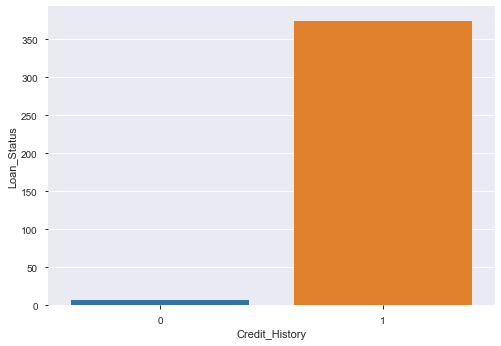

In [34]:
sns.barplot(x='Credit_History',y='Loan_Status',data=Financial_Obligations)

In [35]:
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingClassifier, AdaBoostRegressor
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score, mean_absolute_error
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

In [36]:
Approved_Loans.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area', 'Loan_Status'],
      dtype='object')

In [37]:
cat_label = ['Gender','Married','Dependents', 'Education','Self_Employed', 'Property_Area', 'Loan_Status']

In [38]:
from sklearn.preprocessing import LabelEncoder
cols = cat_label
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(train[c].values)) 
    train[c] = lbl.transform(list(train[c].values))

# shape        
print('Shape all_data: {}'.format(train.shape))

Shape all_data: (554, 13)


In [39]:
Approved_Loans.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 382 entries, 0 to 552
Data columns (total 13 columns):
Loan_ID              382 non-null object
Gender               382 non-null object
Married              382 non-null object
Dependents           382 non-null object
Education            382 non-null object
Self_Employed        382 non-null object
ApplicantIncome      382 non-null int64
CoapplicantIncome    382 non-null float64
LoanAmount           382 non-null int64
Loan_Amount_Term     382 non-null int64
Credit_History       382 non-null int64
Property_Area        382 non-null object
Loan_Status          382 non-null object
dtypes: float64(1), int64(4), object(8)
memory usage: 41.8+ KB


In [40]:
train.head(3)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,1,0,3,0,0,5849,0.0,145,360,1,2,1
1,LP001003,1,1,1,0,0,4583,1508.0,128,360,1,0,0
2,LP001005,1,1,3,0,1,3000,0.0,66,360,1,2,1


In [41]:
test.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area'],
      dtype='object')

In [42]:
test_cat_label = ['Gender','Married','Dependents', 'Education','Self_Employed', 'Property_Area']

In [43]:
cols = test_cat_label
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(test[c].values)) 
    test[c] = lbl.transform(list(test[c].values))

# shape        
print('Shape all_data: {}'.format(test.shape))

Shape all_data: (295, 12)


In [44]:
test.head(3)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,1,1,3,0,0,5720,0,110,360,1,2
1,LP001022,1,1,1,0,0,3076,1500,126,360,1,2
2,LP001031,1,1,2,0,0,5000,1800,208,360,1,2


In [45]:
y = train['Loan_Status']

In [46]:
X = train.drop(['Loan_Status', 'Loan_ID'], axis=1)

#### Models like decision tree and gradient  boost don't recognize strings, which means you usually have to encode strings to numbers. However, it isn't ideal to encode "IDs" because its our unique identifier. If you encode unique identifiers, you would not be able to traceback and compare with oroginal dataset. Hence why "Loan_ID" was also dropped when defining "X" above.

In [47]:
X.shape, y.shape

((554, 11), (554,))

In [48]:
X_test,X_train,y_test,y_train = train_test_split(X,y, random_state= 42, test_size=0.3)

In [49]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
scores = cross_val_score(dtc,X_train, y_train, cv=5)
scores

array([0.76470588, 0.70588235, 0.81818182, 0.72727273, 0.78787879])

In [50]:
gbc = GradientBoostingClassifier()
scores = cross_val_score(gbc,X_train, y_train, cv=5)
scores

array([0.70588235, 0.79411765, 0.84848485, 0.84848485, 0.75757576])

In [51]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [52]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
scores = cross_val_score(xgb,X_train, y_train, cv=5)
scores

array([0.70588235, 0.82352941, 0.78787879, 0.87878788, 0.81818182])

In [64]:
print('Training score is {}'.format(dtc.score(X_train, y_train)))
print('\n')
print('Testing score is {}'.format(dtc.score(X_test, y_test)))
print('\n')
print("mse: {0:.4f}\n".format((mean_squared_error(y_train, dtc.predict(X_train)))))

Training score is 1.0


Testing score is 0.7700258397932817


mse: 0.0000



In [53]:
print('Training score is {}'.format(xgb.score(X_train, y_train)))
print('\n')
print('Testing score is {}'.format(xgb.score(X_test, y_test)))
print('\n')
print("mse: {0:.4f}\n".format((mean_squared_error(y_train, xgb.predict(X_train)))))

Training score is 0.9401197604790419


Testing score is 0.7803617571059431


mse: 0.0599



In [54]:
print('Training score is {}'.format(gbc.score(X_train, y_train)))
print('\n')
print('Testing score is {}'.format(gbc.score(X_test, y_test)))
print('\n')
print("mse: {0:.4f}\n".format((mean_squared_error(y_train, gbc.predict(X_train)))))

Training score is 0.9700598802395209


Testing score is 0.8062015503875969


mse: 0.0299



In [55]:
cols_2_drop = ['Loan_ID']
test1 = test.drop(cols_2_drop, axis =1).copy()

#### Had to copy test data into another data frame we named "test1". We then drop "Loan_ID" from test1 so it can be used by gbc.predict because gbc.predict would not recognize "Loan_ID"; error would be - 'Value Error: could not convert string to float'

In [56]:
prediction = gbc.predict(test1)
prediction

array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [60]:
x_sub = pd.DataFrame({'Loan_ID': test['Loan_ID']})
y_sub = pd.DataFrame({'Loan_Status': prediction})

In [61]:
submission =pd.concat([x_sub, y_sub], axis ='columns')
submission.head()

,Loan_ID,Loan_Status
0,LP001015,1
1,LP001022,1
2,LP001031,1
3,LP001051,1
4,LP001054,1


In [63]:
submission.to_csv('Loan_Predict.csv', index = False )